# Look at year 1979 output from daily and hourly average files

In [1]:
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import cmocean

In [2]:
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])

#### Functions

In [3]:
def setup_axes():

    fig, ax = plt.subplots(2,4, figsize=(14,8), subplot_kw={'projection': ccrs.SouthPolarStereo()}, dpi=400)
    
    for axis in ax.ravel():
        axis.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
        axis.set_boundary(map_circle, transform=axis.transAxes)
            
    return fig, ax

### Main

In [6]:
folder_out = '/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/output/new-setup-testing/'
gridT_1h_interp   = xr.open_dataset(f'{folder_out}BDY_1/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)
gridT_1h_nointerp = xr.open_dataset(f'{folder_out}BDY_1/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)
gridT_3h_nointerp = xr.open_dataset(f'{folder_out}ERA5_3h/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)
gridT_8h_nointerp = xr.open_dataset(f'{folder_out}ERA5_6h/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)
# gridT_6h = xr.open_dataset(f'{folder_out}atm-6h/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)
# gridT_8h = xr.open_dataset(f'{folder_out}atm-8h/eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)_grid_T

In [7]:
JRA = xr.open_dataset('/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/output/reference/'+\
                      'eANT025.L121_1m_19790101_19791231_grid_T.nc').isel(time_counter=7)

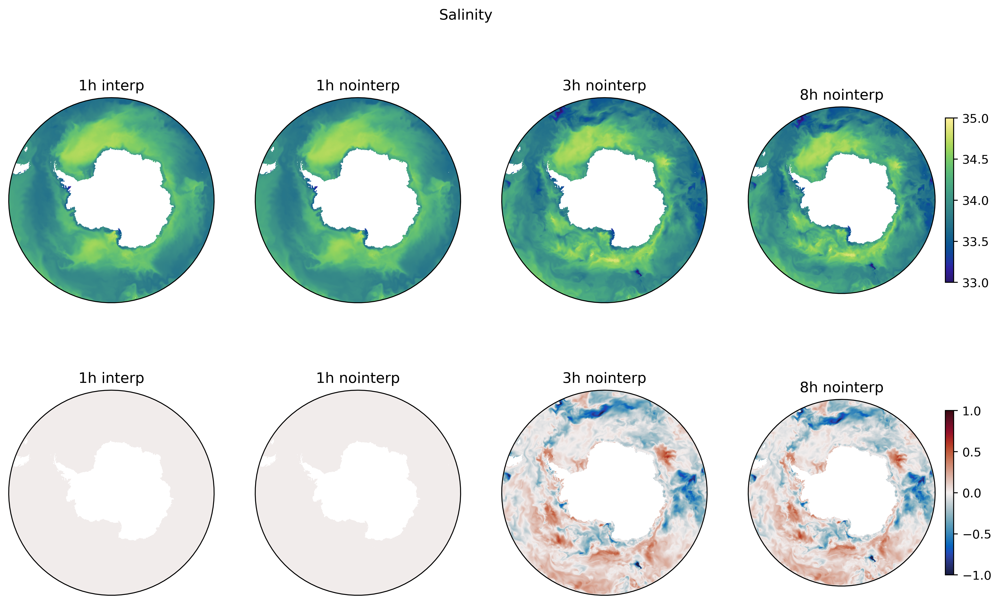

In [8]:
vmin = 33; vmax = 35;

fig, ax = setup_axes()
fig.suptitle('Salinity')
for row in [0,1]:
    ax[row,0].set_title('1h'); ax[row,1].set_title('1h');
    ax[row,2].set_title('3h'); ax[row,3].set_title('3h');

kwags1={'transform':ccrs.PlateCarree(), 'vmin':vmin, 'vmax':vmax, 'cmap':cmocean.cm.haline, 'rasterized':True}
vars = [gridT_1h_interp, gridT_1h_nointerp, gridT_3h_nointerp, gridT_8h_nointerp]
for n, axis in enumerate(ax[0,:].ravel()):
    plot_var = xr.where(vars[n].so.isel(deptht=0) == 0, np.nan, vars[n].so.isel(deptht=0).values)
    cm1 = axis.pcolormesh(vars[n].nav_lon_grid_T, vars[n].nav_lat_grid_T, plot_var, **kwags1);

kwags2={'transform':ccrs.PlateCarree(), 'vmin':-1, 'vmax':1, 'cmap':cmocean.cm.balance, 'rasterized':True}
vars = [gridT_1h_interp, gridT_1h_nointerp, gridT_3h_nointerp, gridT_8h_nointerp]
for n, axis in enumerate(ax[1,:].ravel()):
    plot_var0 = xr.where(vars[0].so.isel(deptht=0) == 0, np.nan, vars[0].so.isel(deptht=0).values)
    plot_varn = xr.where(vars[n].so.isel(deptht=0) == 0, np.nan, vars[n].so.isel(deptht=0).values)
    cm2 = axis.pcolormesh(vars[n].nav_lon_grid_T, vars[n].nav_lat_grid_T, plot_varn - plot_var0, **kwags2);
    
CB1 = fig.colorbar(cm1, ax=ax[0,3], fraction=0.04)
CB2 = fig.colorbar(cm2, ax=ax[1,3], fraction=0.04)

In [22]:
def plot2vars(var1, var2):

    plot_var1 = xr.where(var1.thetao.isel(deptht=0) == 0, np.nan, var1.thetao.isel(deptht=0).values)
    plot_var2 = xr.where(var2.thetao.isel(deptht=0) == 0, np.nan, var2.thetao.isel(deptht=0).values)
    
    fig, ax = plt.subplots(1,2, figsize=(14,7), subplot_kw={'projection': ccrs.SouthPolarStereo()}, dpi=400)
        
    for axis in ax.ravel():
        axis.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
        axis.set_boundary(map_circle, transform=axis.transAxes)
        gl = axis.gridlines(draw_labels=True, ylocs=[]);
            
    ax[0].set_title(f'With JRA55 3h forcing')
    ax[1].set_title(f'With ERA5 1h forcing')
            
    # Separated bathymetries:
    kwags={'transform':ccrs.PlateCarree(), 'vmin':-2, 'vmax':6, 'cmap':cmocean.cm.haline, 'rasterized':True}
    cm1 = ax[0].pcolormesh(var1.nav_lon_grid_T, var1.nav_lat_grid_T, plot_var1, **kwags);
    cm2 = ax[1].pcolormesh(var2.nav_lon_grid_T, var2.nav_lat_grid_T, plot_var2, **kwags);
    CB1 = fig.colorbar(cm1, ax=ax[0], fraction=0.04)
    CB2 = fig.colorbar(cm2, ax=ax[1], fraction=0.04)
        
    return

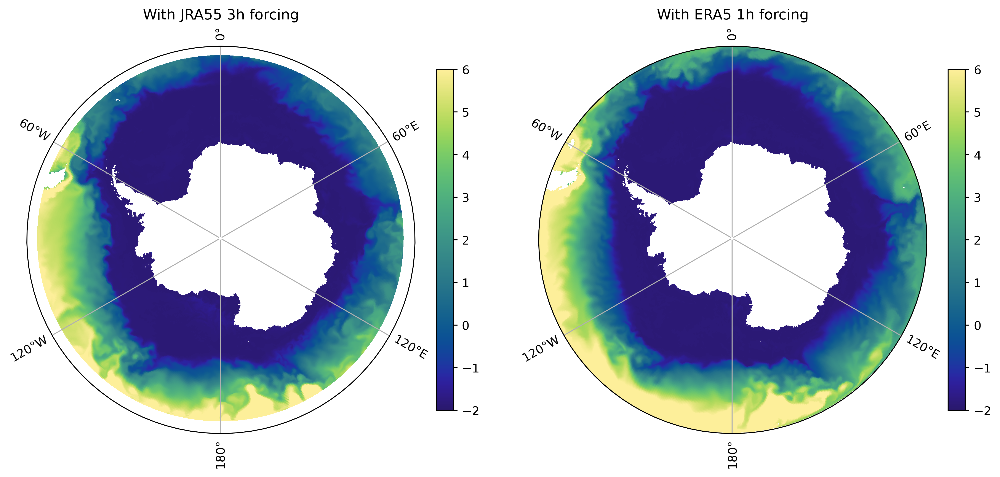

In [25]:
plot2vars(JRA, gridT_1h_interp)

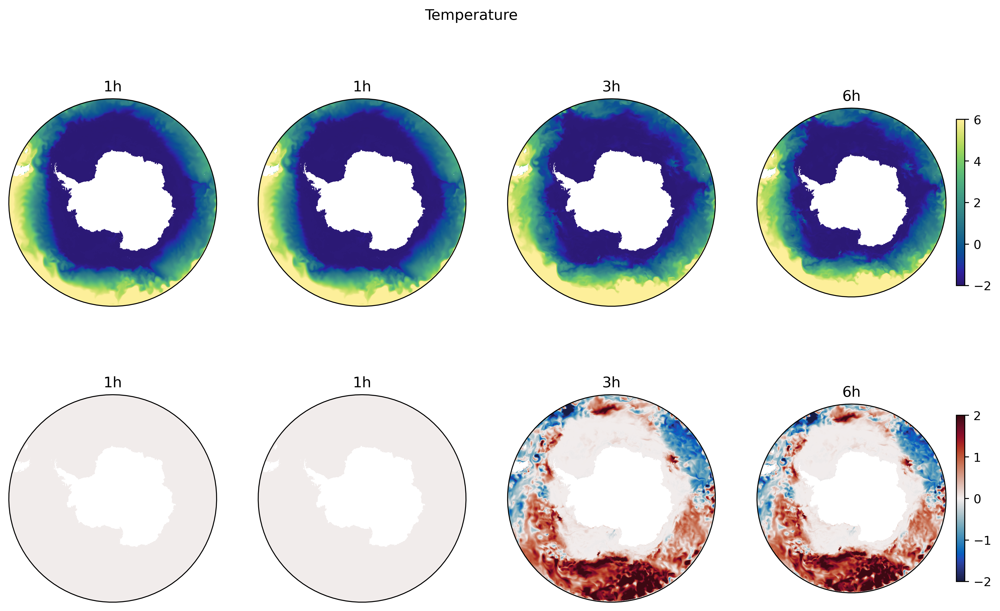

In [13]:
vmin = -2; vmax = 6;

fig, ax = setup_axes()
fig.suptitle('Temperature')
for row in [0,1]:
    ax[row,0].set_title('1h'); ax[row,1].set_title('1h');
    ax[row,2].set_title('3h'); ax[row,3].set_title('6h');

kwags1={'transform':ccrs.PlateCarree(), 'vmin':vmin, 'vmax':vmax, 'cmap':cmocean.cm.haline, 'rasterized':True}
vars = [gridT_1h_interp, gridT_1h_nointerp, gridT_3h_nointerp, gridT_8h_nointerp]
for n, axis in enumerate(ax[0,:].ravel()):
    plot_var = xr.where(vars[n].thetao.isel(deptht=0) == 0, np.nan, vars[n].thetao.isel(deptht=0).values)
    cm1 = axis.pcolormesh(vars[n].nav_lon_grid_T, vars[n].nav_lat_grid_T, plot_var, **kwags1);

kwags2={'transform':ccrs.PlateCarree(), 'vmin':-2, 'vmax':2, 'cmap':cmocean.cm.balance, 'rasterized':True}
vars = [gridT_1h_interp, gridT_1h_nointerp, gridT_3h_nointerp, gridT_8h_nointerp]
for n, axis in enumerate(ax[1,:].ravel()):
    plot_var0 = xr.where(vars[0].thetao.isel(deptht=0) == 0, np.nan, vars[0].thetao.isel(deptht=0).values)
    plot_varn = xr.where(vars[n].thetao.isel(deptht=0) == 0, np.nan, vars[n].thetao.isel(deptht=0).values)
    cm2 = axis.pcolormesh(vars[n].nav_lon_grid_T, vars[n].nav_lat_grid_T, plot_varn - plot_var0, **kwags2);
    
CB1 = fig.colorbar(cm1, ax=ax[0,3], fraction=0.04)
CB2 = fig.colorbar(cm2, ax=ax[1,3], fraction=0.04)